In [6]:
import tensorflow as tf
import tensorflow.keras as keras
import pickle
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from glob import glob

# Create Embeddings

In [19]:
embedder = keras.models.load_model('./Models/facenet_keras.h5')
# summarize input and output shape
print(embedder.inputs)
print(embedder.outputs)

[<KerasTensor: shape=(None, 160, 160, 3) dtype=float32 (created by layer 'input_1')>]
[<KerasTensor: shape=(None, 128) dtype=float32 (created by layer 'Bottleneck_BatchNorm')>]


In [5]:
with open('./Data/faces.dat', 'rb') as f:
    data = pickle.load(f)
X_train, X_test, y_train, y_test = data['X_train'], data['X_test'], data['y_train'], data['y_test']

In [17]:
def get_embedding(face_pixels, embedder):
    face_pixels = cv2.resize(face_pixels, dsize=(160, 160), interpolation=cv2.INTER_CUBIC)
    # scale pixel values
    face_pixels = face_pixels.astype('float32')
    # standardize pixel values across channels (global)
    mean, std = face_pixels.mean(), face_pixels.std()
    face_pixels = (face_pixels - mean) / std

    # transform face into one sample
    samples = np.expand_dims(face_pixels, axis=0)
    
    # make prediction to get embedding
    embedding = embedder.predict(samples)[0]
    return embedding

In [51]:
X_train_emb = []
X_test_emb = []
for face in tqdm(X_train):
    X_train_emb.append(get_embedding(face, embedder))
for face in tqdm(X_test):
    X_test_emb.append(get_embedding(face, embedder))
    
    

 16%|█▌        | 184/1134 [00:12<01:02, 15.08it/s]


KeyboardInterrupt: 

In [ ]:
with open('./Data/face_emb.dat', 'wb') as f:
    pickle.dump({'X_train_emb': X_train_emb, 'X_test_emb': X_test_emb}, f)

# Build Classifier

In [1]:
# load embeddings
import pickle

with open('./Data/face_emb.dat', 'rb') as f:
    data = pickle.load(f)
X_train_emb = data['X_train_emb']
X_test_emb = data['X_test_emb']

In [2]:
from sklearn.preprocessing import Normalizer, LabelEncoder

In [3]:
# normalize input vectors
in_encoder = Normalizer(norm='l2')
X_train_norm = in_encoder.transform(X_train_emb)
X_test_norm = in_encoder.transform(X_test_emb)

In [7]:
# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(y_train)
y_train_enc = out_encoder.transform(y_train)
y_test_enc = out_encoder.transform(y_test)
out_encoder.classes_

array(['Aman', 'Chris', 'Fahad', 'Prith'], dtype='<U5')

In [8]:
from sklearn.svm import SVC

In [9]:
# fit model
model = SVC(kernel='linear', probability=True)
model.fit(X_train_norm, y_train_enc)

SVC(kernel='linear', probability=True)

# Results

In [84]:
from sklearn.metrics import accuracy_score

In [85]:
# predict
yhat_train = model.predict(X_train_norm)
yhat_test = model.predict(X_test_norm)
# score
score_train = accuracy_score(y_train_enc, yhat_train)
score_test = accuracy_score(y_test_enc, yhat_test)
# summarize
print('Accuracy: train=%.3f, test=%.3f' % (score_train*100, score_test*100))

Accuracy: train=99.030, test=97.619


This is Aman with probability 0.9984


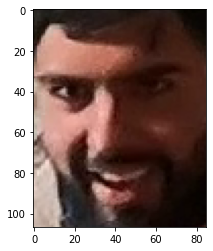

This is Fahad with probability 0.9985


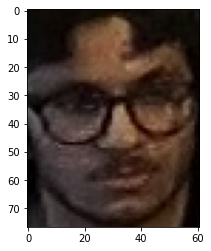

This is Prith with probability 0.9971


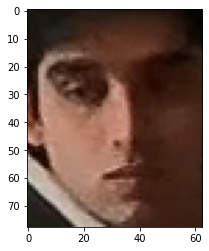

This is Aman with probability 0.9719


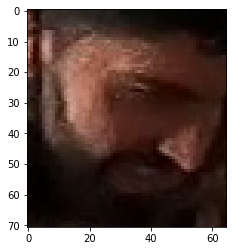

This is Prith with probability 0.9575


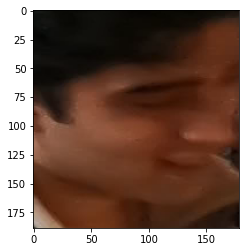

This is Aman with probability 0.9888


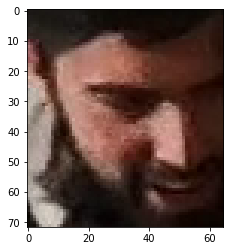

This is Chris with probability 0.9995


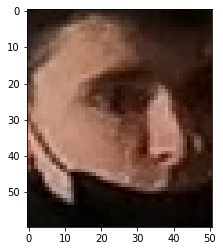

This is Fahad with probability 0.993


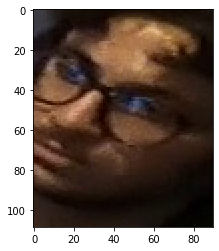

This is Fahad with probability 0.7015


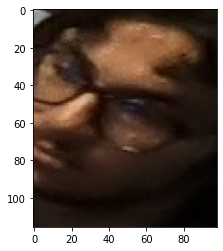

This is Prith with probability 0.9529


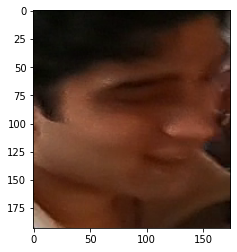

This is Prith with probability 0.9967


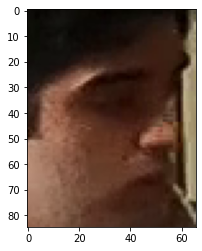

This is Aman with probability 0.9786


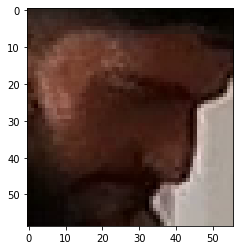

This is Chris with probability 0.884


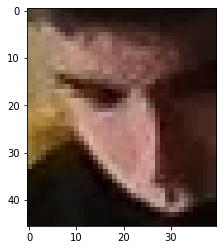

This is Chris with probability 0.9996


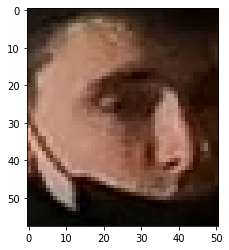

This is Prith with probability 0.9945


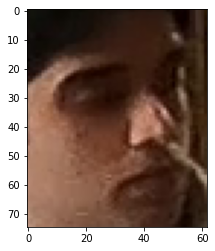

This is Aman with probability 0.9986


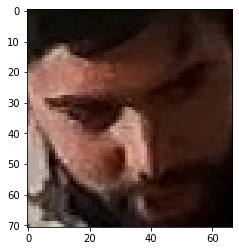

This is Chris with probability 0.9983


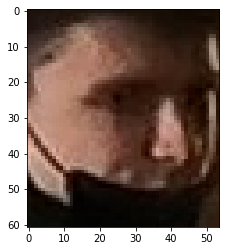

This is Aman with probability 0.9893


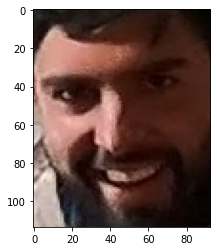

This is Chris with probability 0.7768


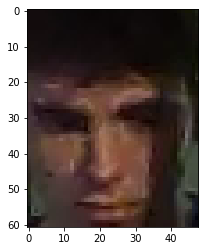

This is Chris with probability 0.6552


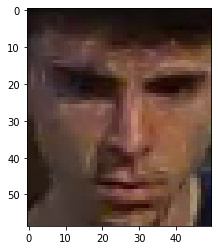

This is Prith with probability 0.997


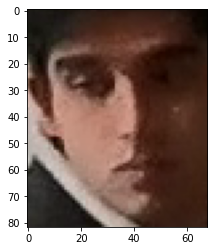

This is Chris with probability 0.7947


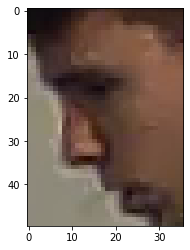

This is Prith with probability 1.0


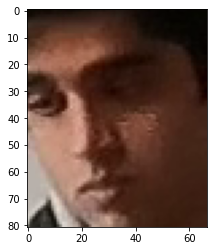

This is Chris with probability 0.996


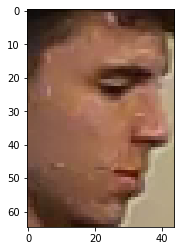

This is Fahad with probability 0.9969


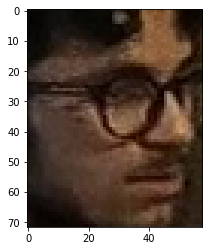

This is Fahad with probability 0.9851


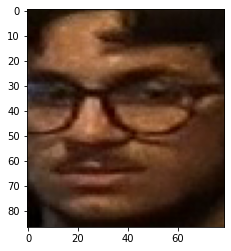

This is Chris with probability 0.9998


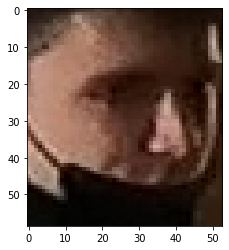

This is Aman with probability 0.8329


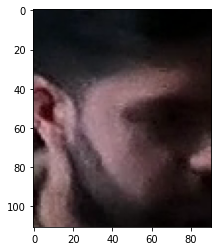

This is Aman with probability 0.9999


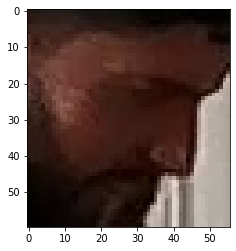

This is Prith with probability 0.9964


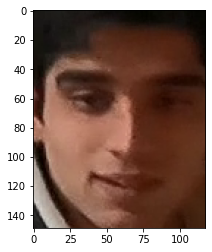

This is Chris with probability 0.9974


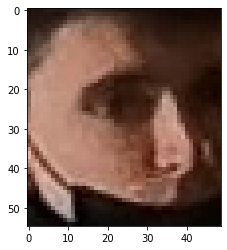

This is Fahad with probability 0.9878


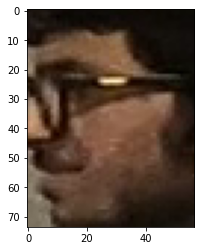

This is Prith with probability 0.9966


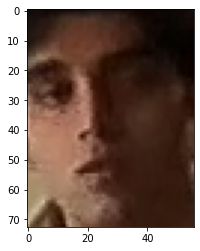

This is Chris with probability 0.9995


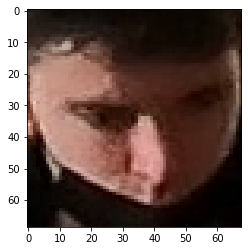

This is Prith with probability 0.9966


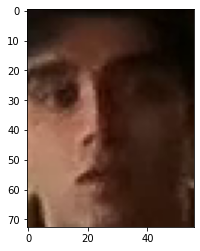

This is Prith with probability 0.9775


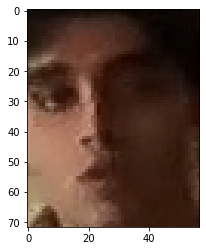

This is Chris with probability 0.9998


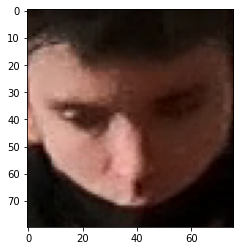

This is Aman with probability 0.7262


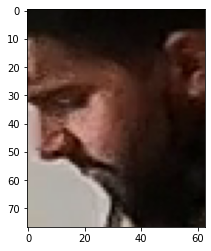

This is Chris with probability 1.0


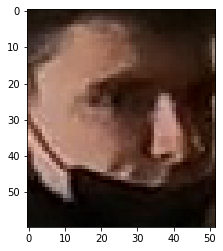

This is Aman with probability 0.9977


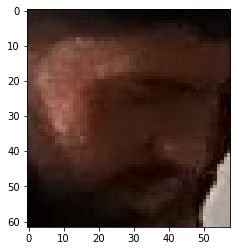

This is Fahad with probability 0.99


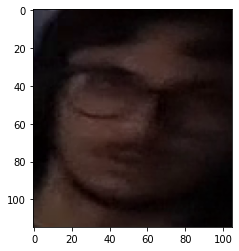

This is Aman with probability 0.9921


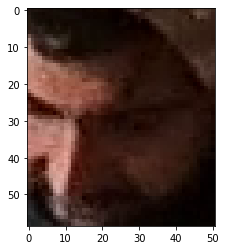

This is Fahad with probability 0.9709


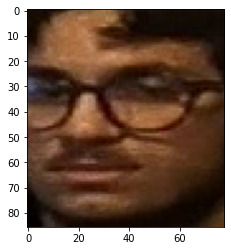

This is Fahad with probability 0.988


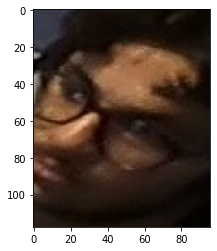

This is Prith with probability 0.9914


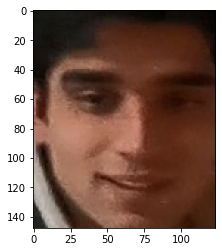

This is Aman with probability 0.9999


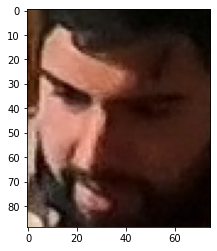

This is Fahad with probability 0.9996


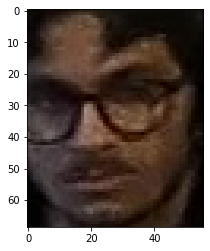

This is Aman with probability 0.9987


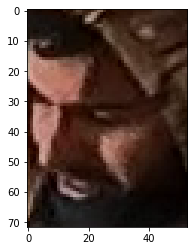

This is Chris with probability 0.9801


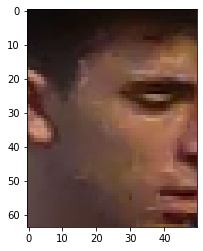

This is Prith with probability 0.9363


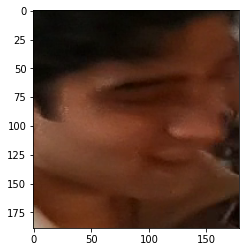

This is Chris with probability 0.9991


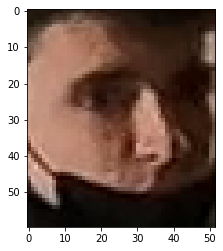

This is Aman with probability 0.9566


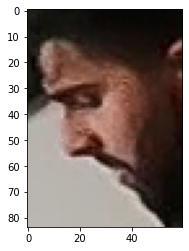

This is Fahad with probability 0.9911


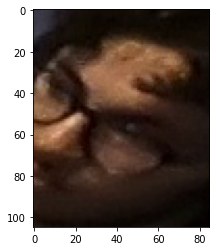

This is Chris with probability 0.9676


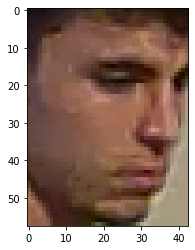

This is Chris with probability 0.9995


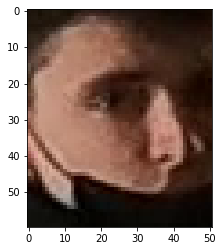

This is Fahad with probability 0.9392


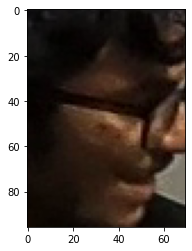

This is Fahad with probability 0.9985


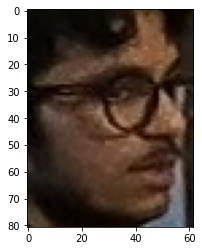

This is Aman with probability 0.9856


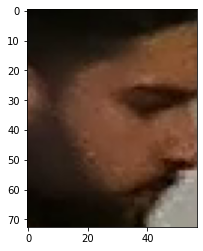

This is Fahad with probability 0.999


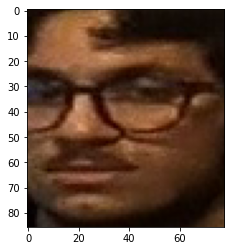

This is Aman with probability 0.9962


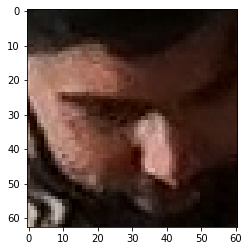

This is Aman with probability 0.8875


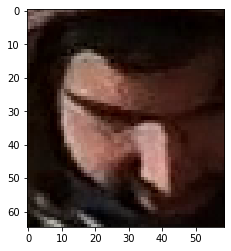

This is Aman with probability 0.9998


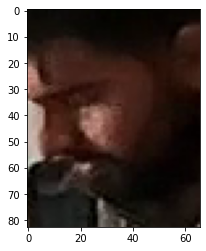

This is Chris with probability 0.9999


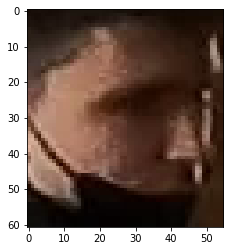

This is Fahad with probability 0.9997


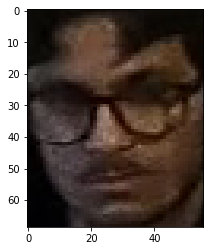

This is Aman with probability 0.9973


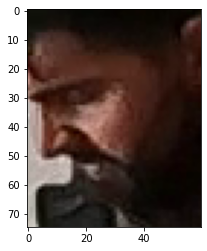

This is Aman with probability 0.9966


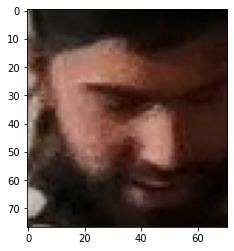

This is Prith with probability 0.9019


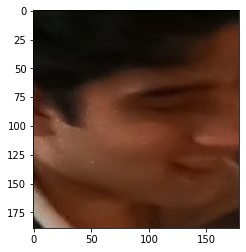

This is Prith with probability 1.0


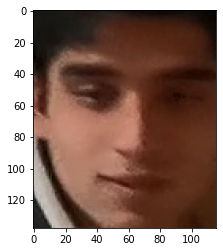

This is Fahad with probability 0.9996


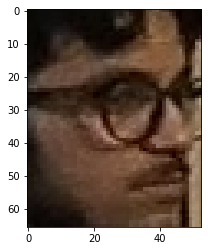

This is Aman with probability 0.9898


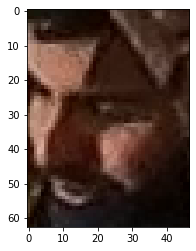

This is Prith with probability 0.9989


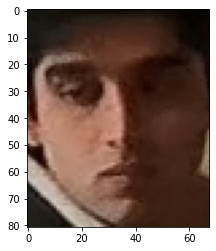

This is Prith with probability 0.9583


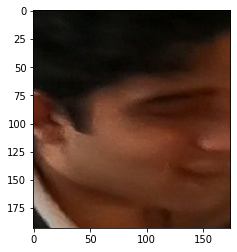

This is Aman with probability 0.9937


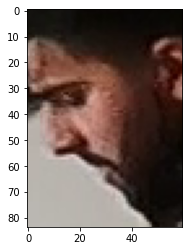

This is Prith with probability 1.0


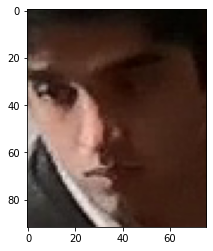

This is Prith with probability 0.8845


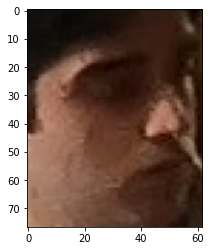

This is Fahad with probability 0.9952


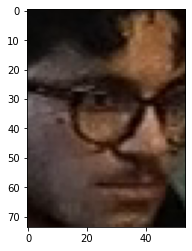

This is Chris with probability 0.8888


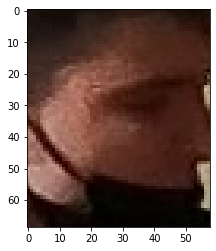

This is Prith with probability 0.9965


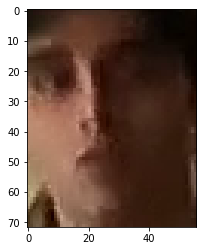

This is Fahad with probability 0.4352


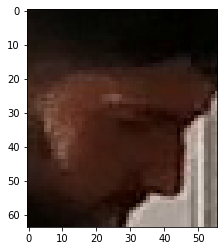

This is Fahad with probability 0.9979


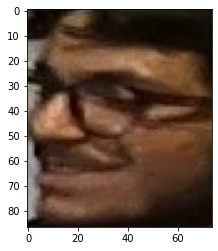

This is Chris with probability 0.9997


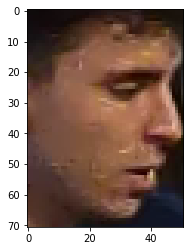

This is Prith with probability 0.9988


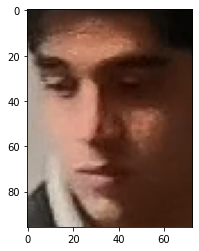

This is Fahad with probability 0.9777


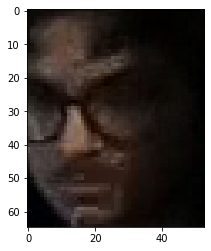

This is Aman with probability 0.5025


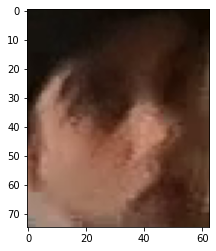

This is Aman with probability 0.9794


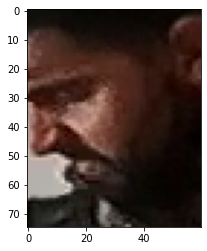

This is Prith with probability 1.0


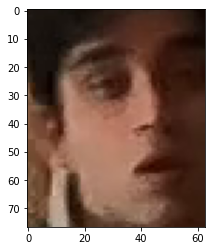

This is Chris with probability 0.9999


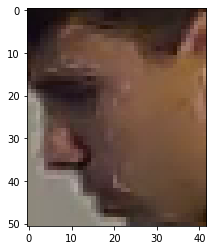

This is Aman with probability 0.9995


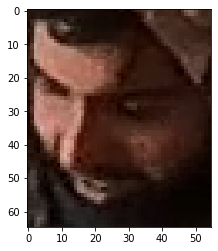

This is Chris with probability 0.9995


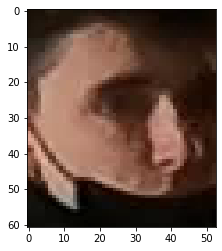

This is Fahad with probability 0.9998


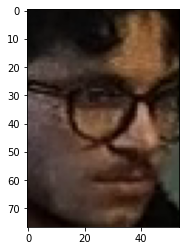

This is Aman with probability 0.9979


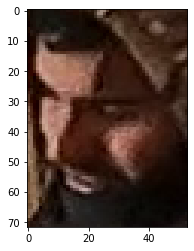

This is Aman with probability 0.9997


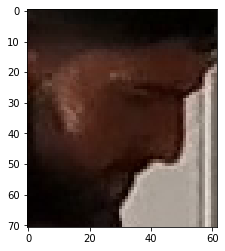

This is Fahad with probability 0.9959


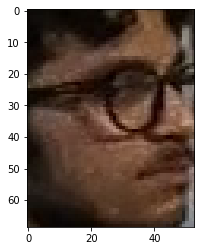

This is Aman with probability 0.9663


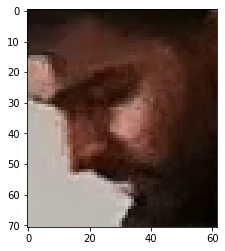

This is Fahad with probability 0.9977


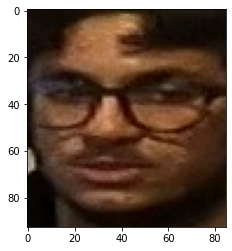

This is Aman with probability 0.9999


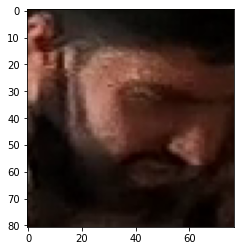

This is Aman with probability 0.9069


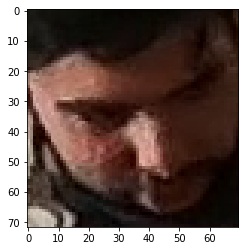

This is Fahad with probability 0.9999


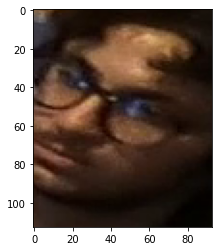

This is Fahad with probability 0.9635


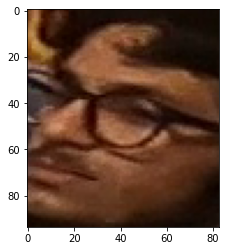

This is Fahad with probability 0.9826


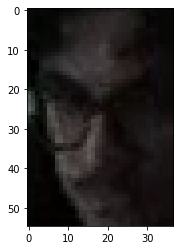

This is Fahad with probability 0.9989


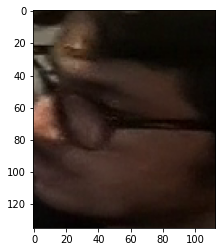

This is Prith with probability 1.0


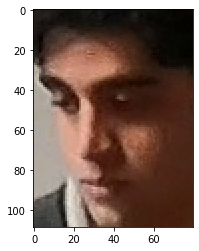

This is Fahad with probability 0.9923


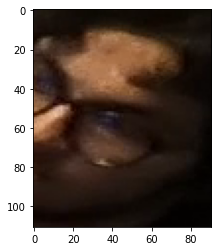

This is Prith with probability 0.9985


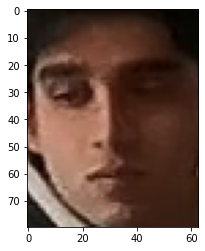

This is Aman with probability 0.9682


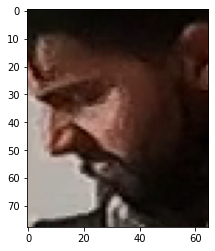

This is Prith with probability 0.9973


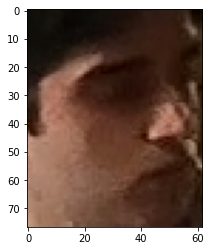

This is Aman with probability 0.9924


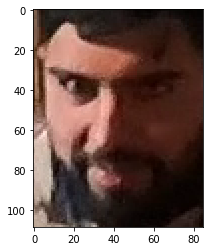

This is Prith with probability 0.9913


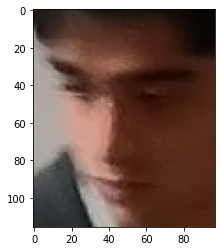

This is Prith with probability 1.0


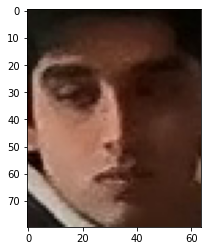

This is Fahad with probability 0.9891


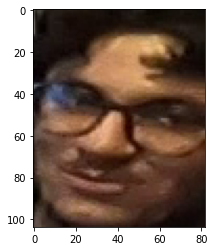

This is Chris with probability 0.9968


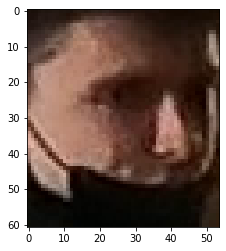

This is Chris with probability 0.9861


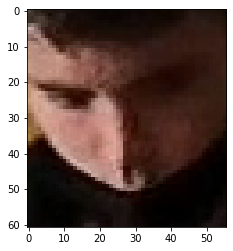

This is Chris with probability 0.9986


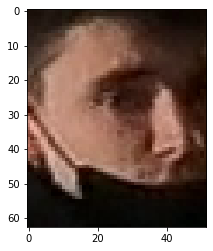

This is Chris with probability 0.998


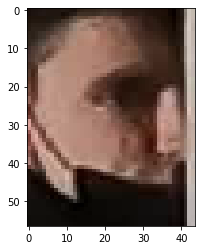

This is Fahad with probability 0.9834


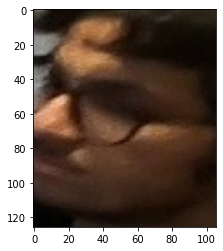

This is Aman with probability 0.9773


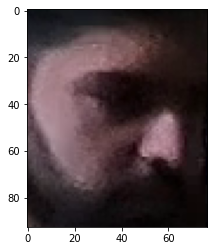

This is Chris with probability 0.9982


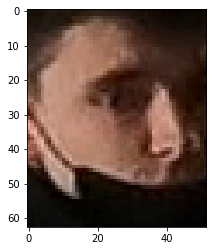

This is Prith with probability 0.9713


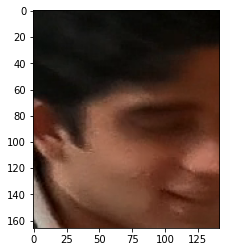

This is Prith with probability 0.9817


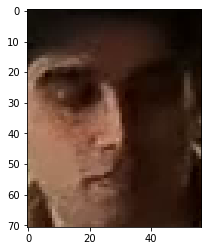

This is Aman with probability 0.9983


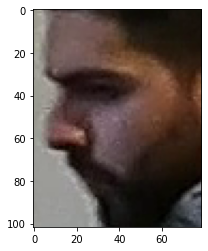

This is Prith with probability 0.9974


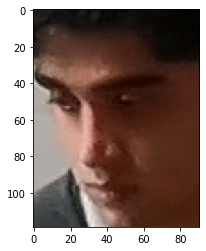

This is Fahad with probability 0.9995


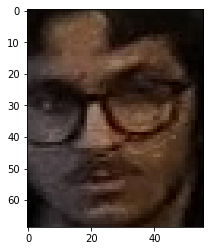

This is Chris with probability 0.9853


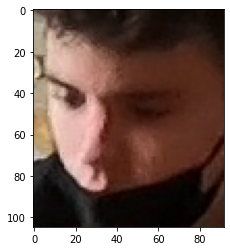

This is Chris with probability 0.9859


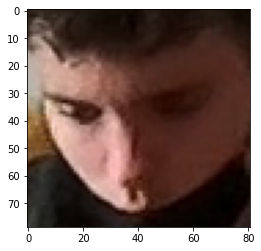

This is Aman with probability 0.9992


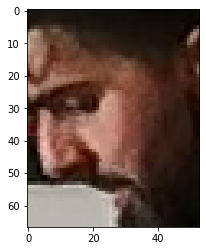

This is Fahad with probability 0.9976


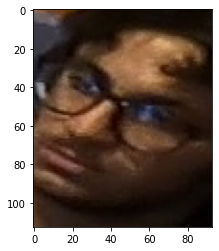

This is Aman with probability 0.9758


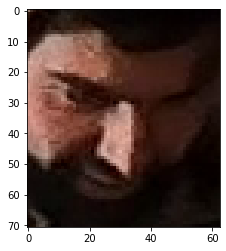

This is Aman with probability 0.9833


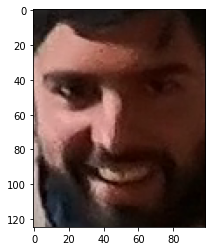

This is Aman with probability 0.9988


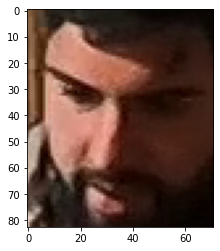

This is Fahad with probability 0.9997


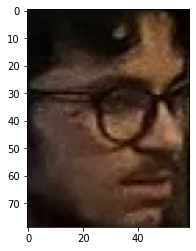

This is Chris with probability 0.955


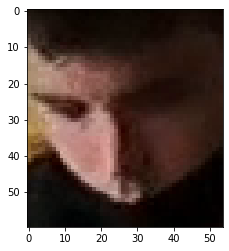

This is Fahad with probability 0.9978


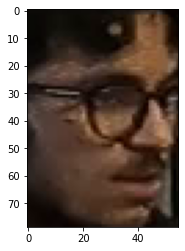

This is Aman with probability 0.9946


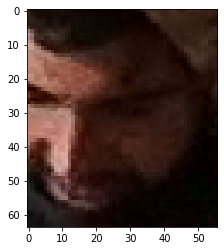

This is Fahad with probability 0.9998


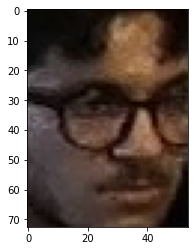

This is Chris with probability 0.999


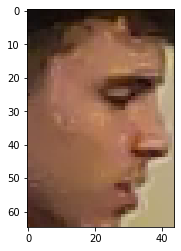

This is Prith with probability 1.0


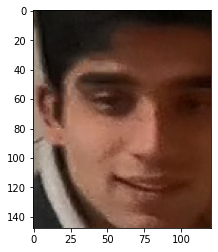

This is Fahad with probability 0.9543


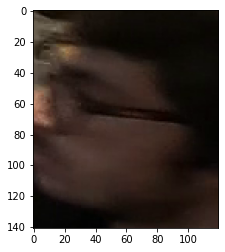

This is Chris with probability 0.9998


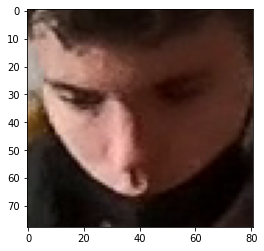

This is Chris with probability 0.9959


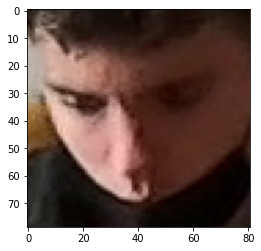

This is Prith with probability 0.9984


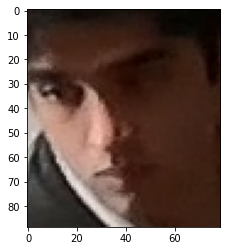

This is Aman with probability 0.9999


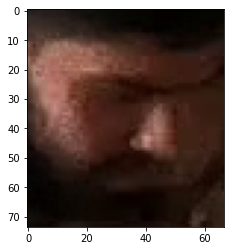

This is Prith with probability 1.0


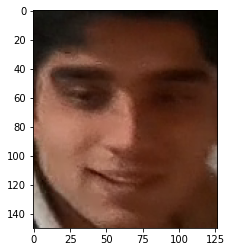

This is Fahad with probability 0.3506


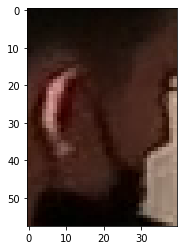

This is Fahad with probability 0.9407


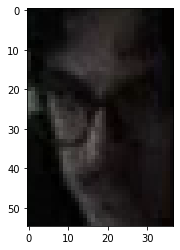

This is Prith with probability 1.0


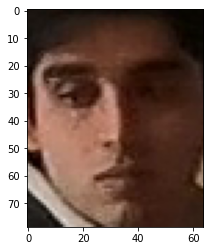

This is Prith with probability 1.0


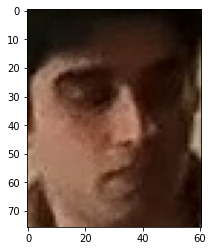

This is Aman with probability 0.9635


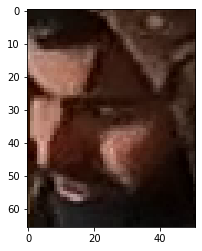

This is Aman with probability 0.9947


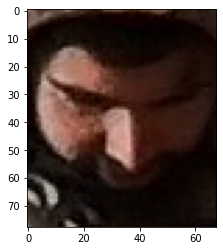

This is Chris with probability 0.9992


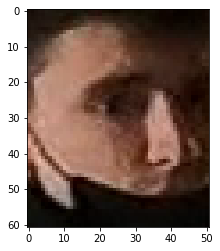

This is Aman with probability 0.9997


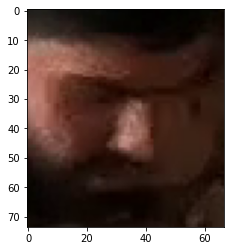

This is Aman with probability 0.993


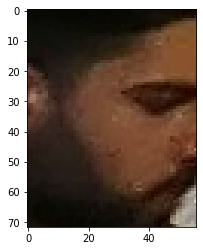

This is Prith with probability 0.9843


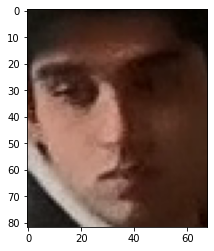

This is Prith with probability 0.8341


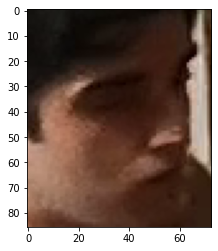

This is Chris with probability 0.9822


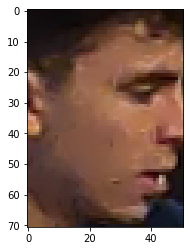

This is Aman with probability 0.9498


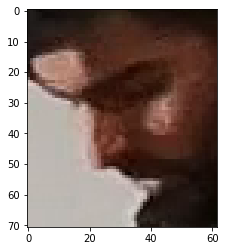

This is Chris with probability 0.9809


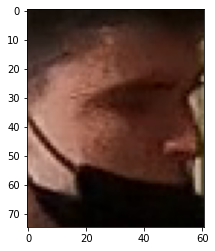

This is Chris with probability 0.8659


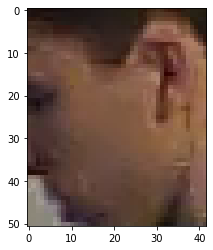

This is Fahad with probability 0.9945


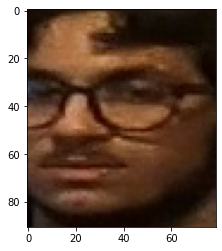

This is Prith with probability 0.9953


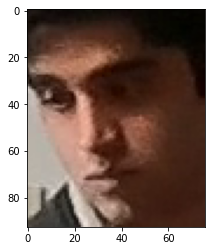

This is Fahad with probability 0.9892


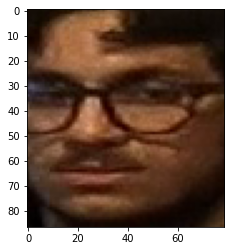

This is Chris with probability 0.9988


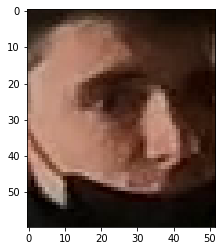

This is Aman with probability 0.9775


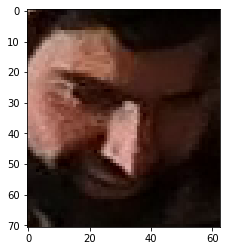

This is Aman with probability 0.8158


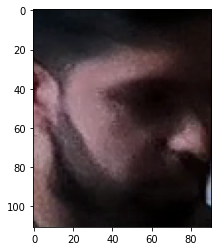

This is Fahad with probability 0.9915


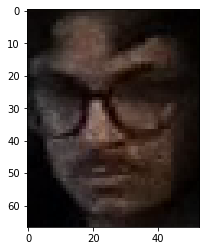

This is Aman with probability 0.9675


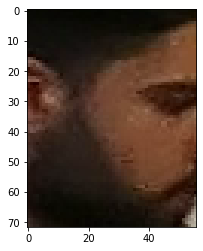

This is Fahad with probability 0.9161


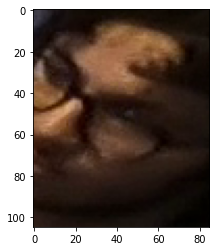

This is Prith with probability 0.9989


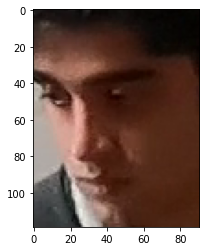

This is Aman with probability 0.9985


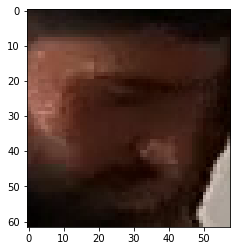

This is Prith with probability 0.976


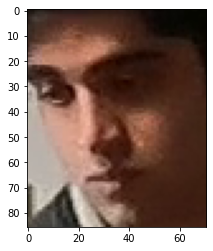

This is Fahad with probability 0.8123


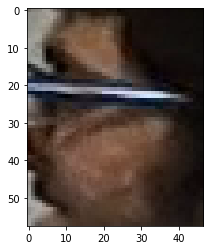

This is Aman with probability 0.9881


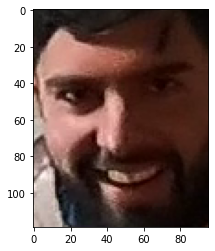

This is Fahad with probability 0.9922


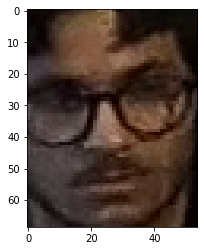

This is Fahad with probability 0.9819


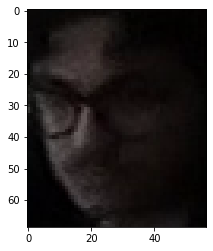

This is Fahad with probability 0.9516


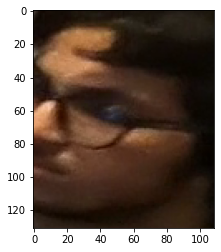

This is Prith with probability 0.9825


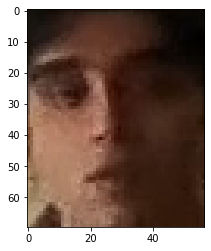

This is Aman with probability 0.7757


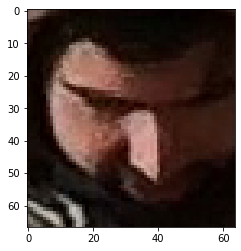

This is Aman with probability 0.9982


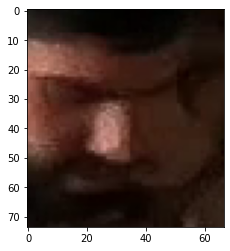

This is Chris with probability 0.9973


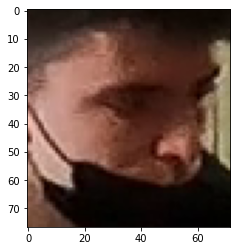

This is Chris with probability 0.9737


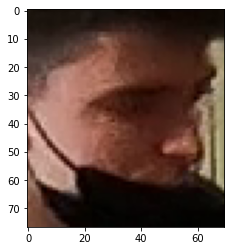

This is Fahad with probability 0.9332


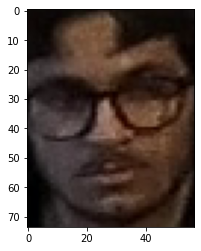

This is Fahad with probability 0.985


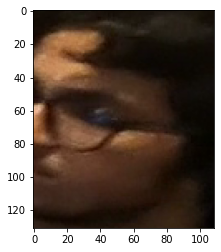

This is Prith with probability 0.9951


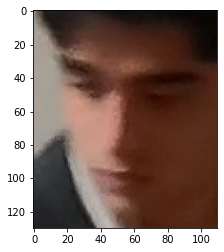

This is Prith with probability 0.9977


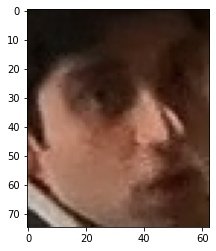

This is Fahad with probability 0.9791


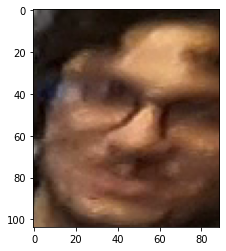

This is Fahad with probability 0.9896


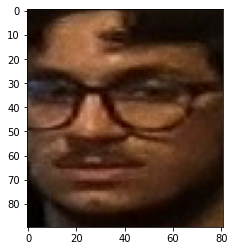

This is Chris with probability 0.9997


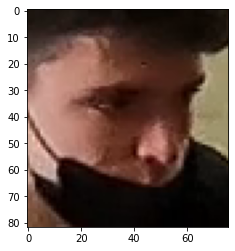

This is Prith with probability 1.0


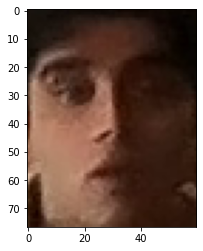

This is Prith with probability 0.9956


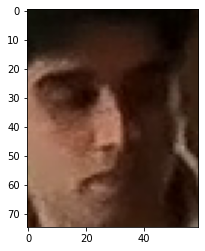

This is Prith with probability 1.0


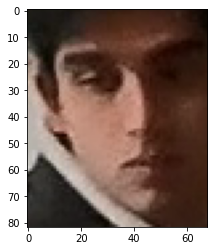

This is Prith with probability 0.9861


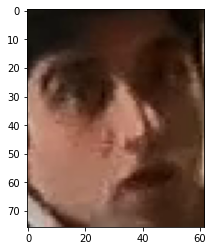

This is Chris with probability 0.9998


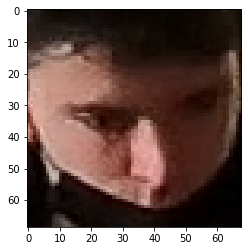

This is Aman with probability 0.9281


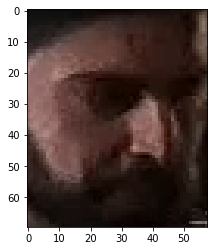

This is Fahad with probability 0.9915


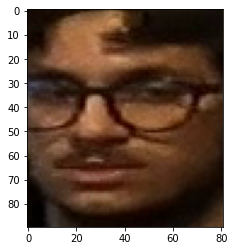

This is Aman with probability 0.9825


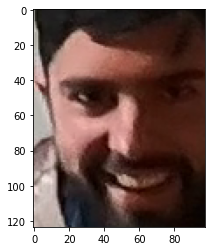

This is Prith with probability 0.9805


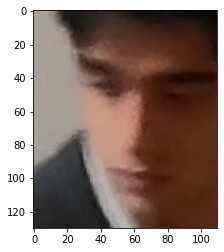

This is Aman with probability 0.9979


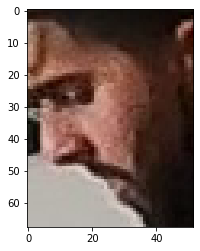

This is Fahad with probability 0.9751


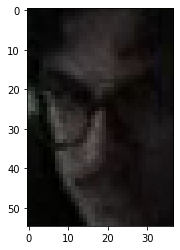

This is Aman with probability 0.9977


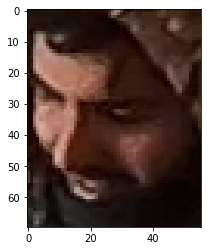

This is Prith with probability 0.9984


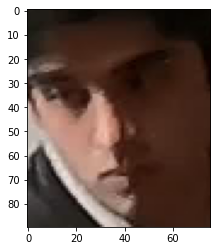

This is Fahad with probability 0.9966


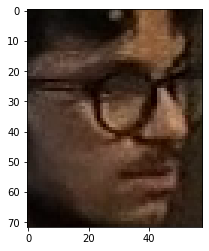

This is Prith with probability 1.0


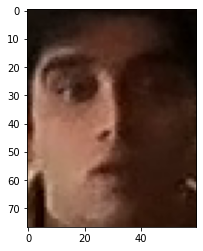

This is Fahad with probability 0.9962


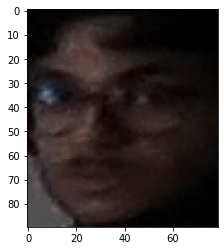

This is Chris with probability 0.9938


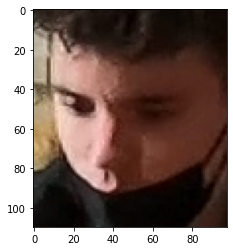

This is Aman with probability 0.9858


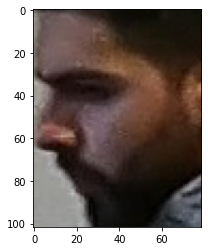

This is Fahad with probability 0.9987


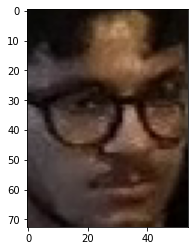

This is Fahad with probability 0.9833


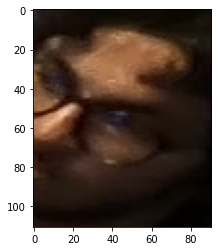

This is Chris with probability 0.9997


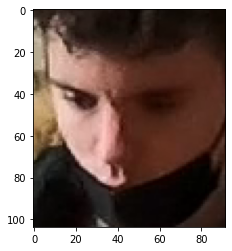

This is Prith with probability 1.0


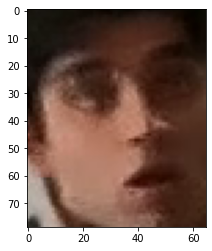

This is Chris with probability 0.997


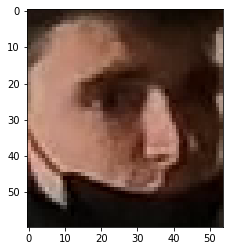

This is Aman with probability 0.9885


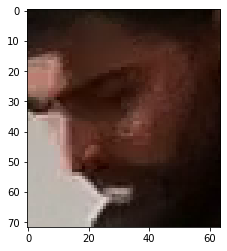

This is Fahad with probability 0.9815


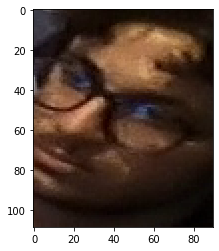

This is Prith with probability 1.0


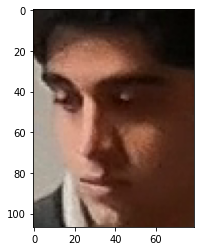

This is Aman with probability 0.9974


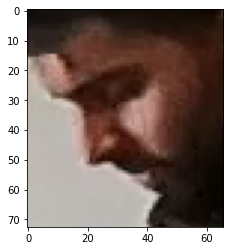

This is Fahad with probability 0.9941


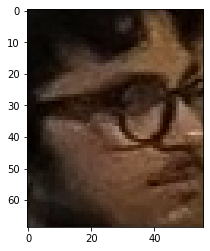

This is Prith with probability 0.9969


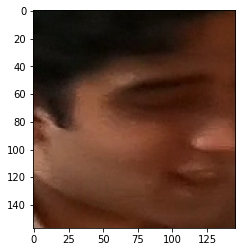

This is Prith with probability 0.9977


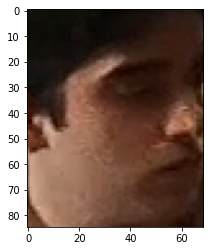

This is Aman with probability 0.988


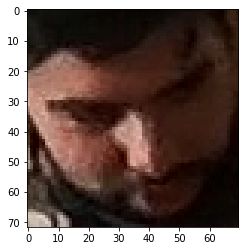

This is Aman with probability 0.998


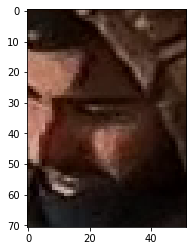

This is Prith with probability 0.9957


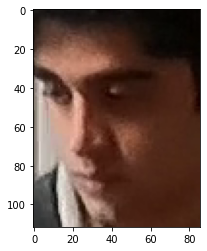

This is Aman with probability 0.9983


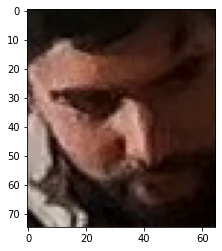

This is Aman with probability 0.7915


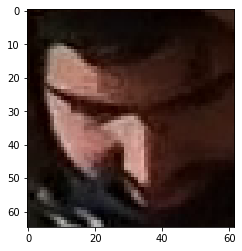

This is Aman with probability 0.9986


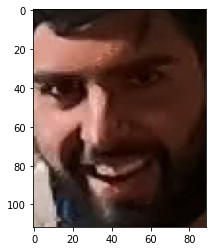

This is Prith with probability 1.0


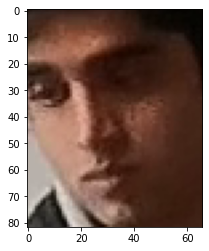

This is Prith with probability 0.9975


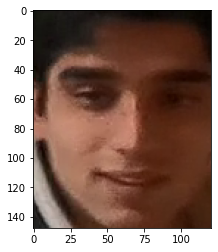

This is Fahad with probability 0.9903


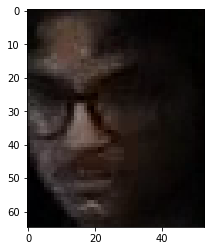

This is Aman with probability 0.7667


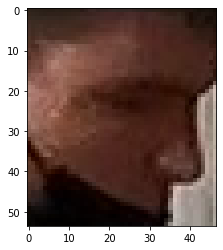

This is Aman with probability 0.9995


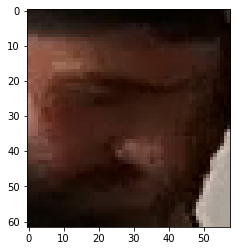

This is Prith with probability 0.9942


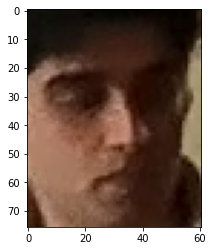

This is Chris with probability 0.9978


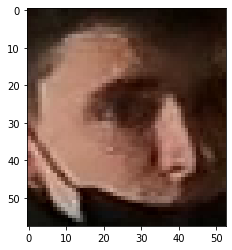

This is Prith with probability 0.9918


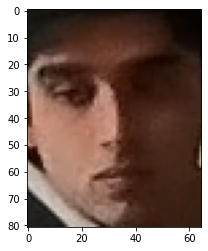

This is Chris with probability 0.9898


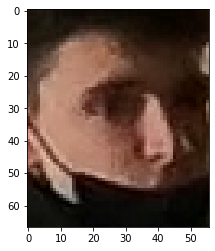

This is Fahad with probability 0.9997


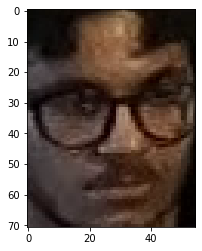

This is Chris with probability 0.995


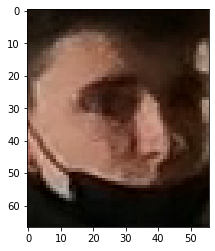

This is Prith with probability 1.0


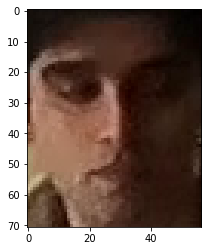

This is Fahad with probability 0.9936


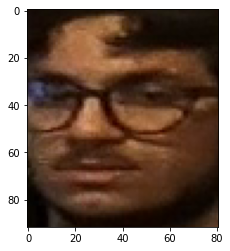

This is Fahad with probability 0.9995


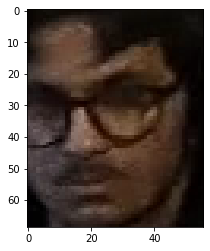

This is Fahad with probability 0.9958


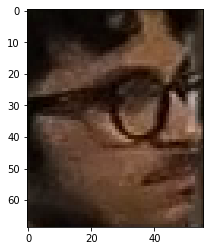

This is Aman with probability 0.9992


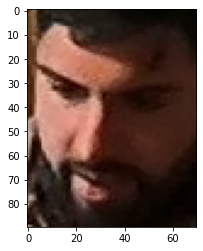

This is Chris with probability 0.9773


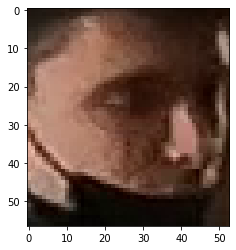

This is Fahad with probability 0.9999


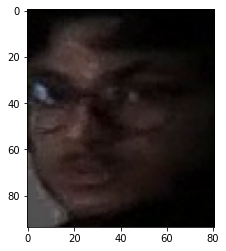

This is Chris with probability 0.9999


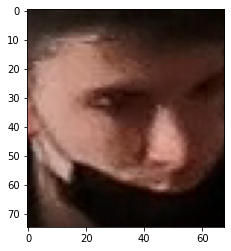

This is Fahad with probability 0.998


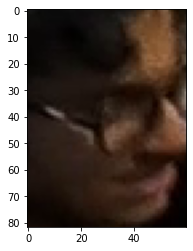

This is Chris with probability 0.9972


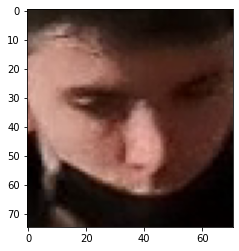

This is Chris with probability 0.9602


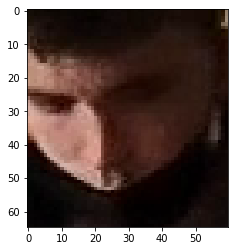

This is Chris with probability 0.9997


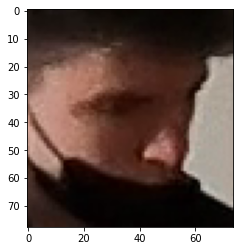

This is Fahad with probability 0.942


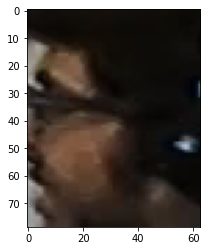

This is Aman with probability 0.9849


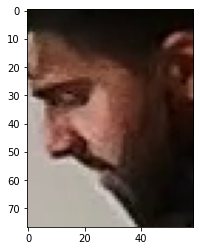

This is Aman with probability 0.7161


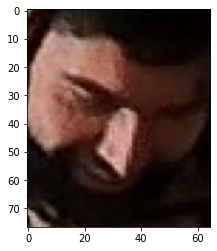

This is Chris with probability 0.9961


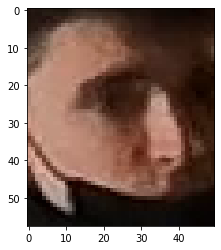

This is Aman with probability 0.998


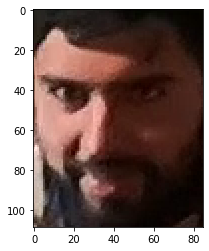

This is Aman with probability 0.9999


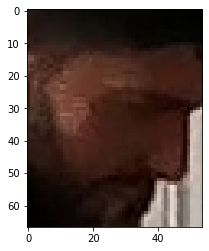

This is Prith with probability 0.99


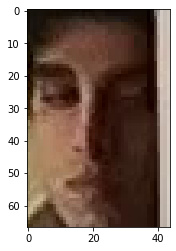

This is Chris with probability 0.9975


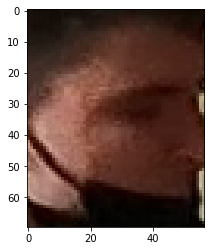

This is Prith with probability 0.9966


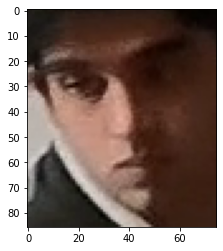

This is Fahad with probability 0.9997


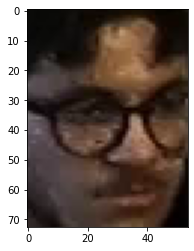

This is Prith with probability 0.998


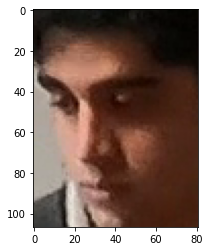

This is Chris with probability 0.963


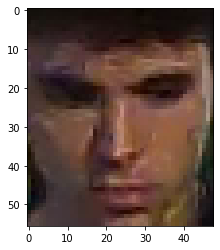

This is Chris with probability 0.9955


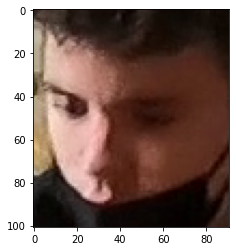

This is Chris with probability 0.9997


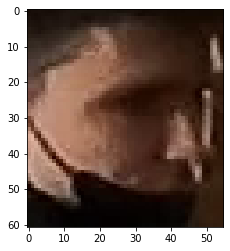

This is Aman with probability 0.9995


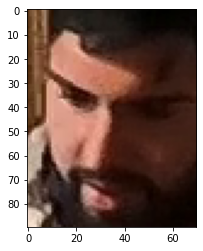

This is Fahad with probability 0.9898


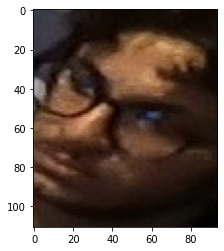

This is Prith with probability 0.9923


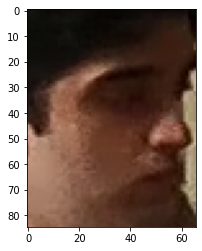

This is Prith with probability 0.9808


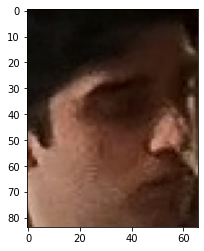

This is Fahad with probability 0.9962


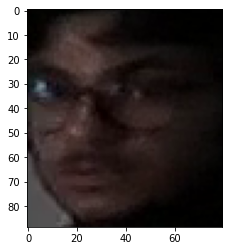

This is Chris with probability 0.9773


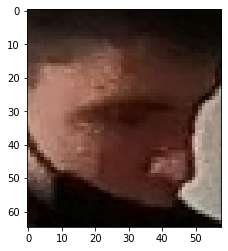

This is Prith with probability 1.0


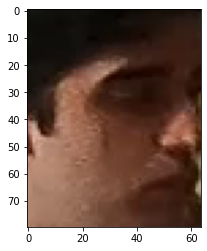

This is Chris with probability 0.9982


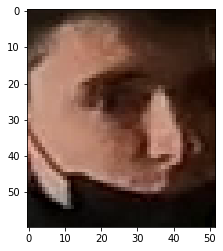

This is Prith with probability 0.9974


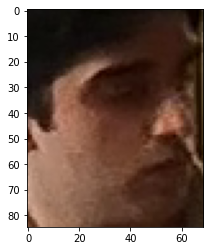

This is Prith with probability 1.0


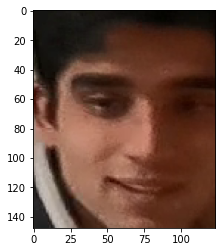

This is Aman with probability 0.9079


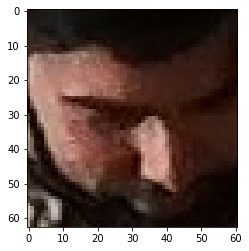

This is Chris with probability 0.9998


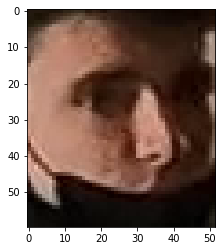

This is Aman with probability 0.9887


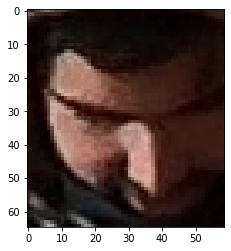

This is Chris with probability 0.9991


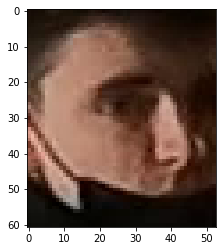

This is Chris with probability 0.9999


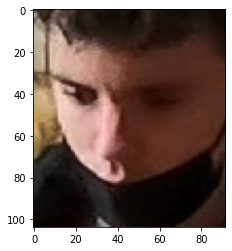

This is Prith with probability 0.9968


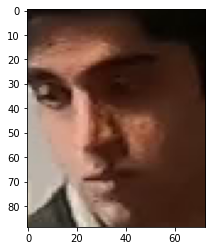

This is Fahad with probability 0.8641


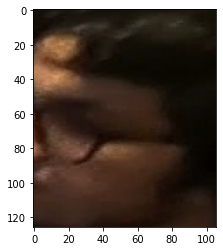

This is Fahad with probability 0.6899


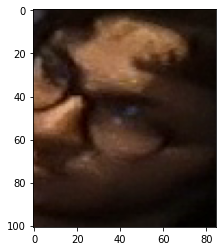

This is Fahad with probability 0.7524


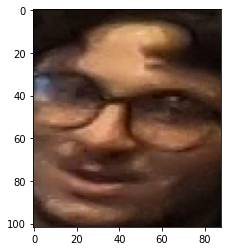

This is Fahad with probability 0.9988


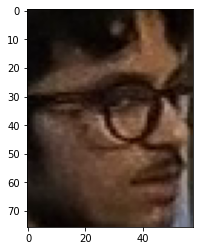

This is Chris with probability 0.996


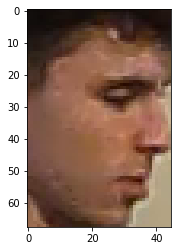

This is Aman with probability 0.9827


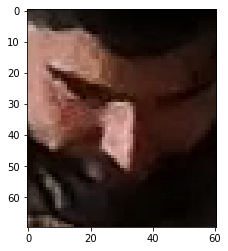

This is Fahad with probability 0.9384


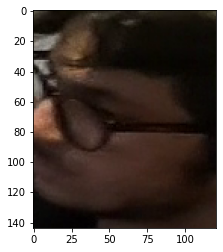

This is Aman with probability 0.9661


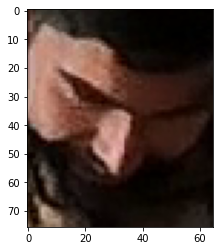

This is Aman with probability 0.8278


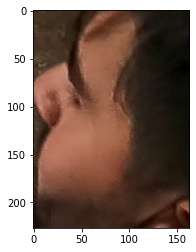

This is Chris with probability 0.9995


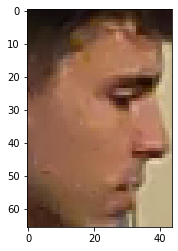

This is Chris with probability 0.9999


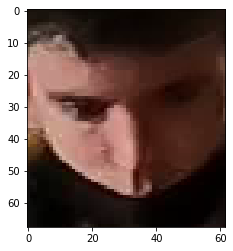

This is Aman with probability 0.6309


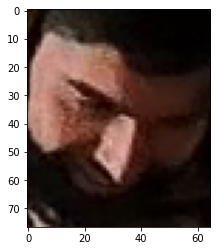

This is Prith with probability 0.9948


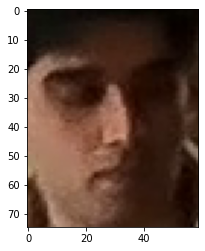

This is Fahad with probability 0.9938


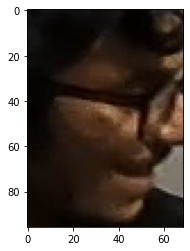

This is Fahad with probability 0.9985


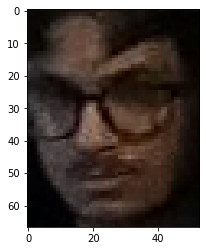

This is Aman with probability 0.9793


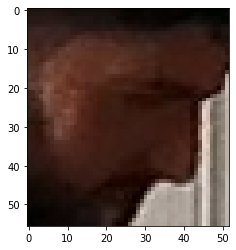

This is Prith with probability 0.9846


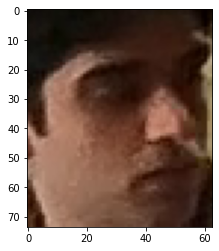

This is Prith with probability 1.0


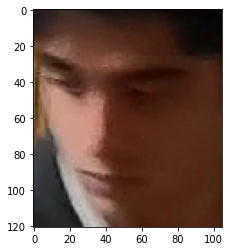

This is Aman with probability 0.8402


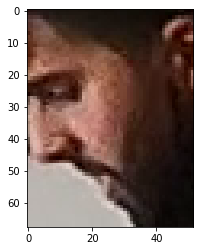

This is Chris with probability 0.9984


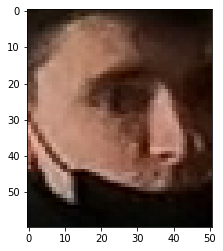

This is Aman with probability 0.9424


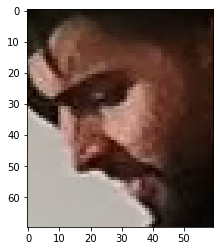

This is Aman with probability 0.9793


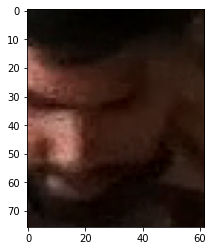

This is Prith with probability 1.0


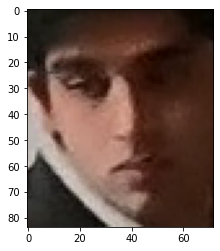

This is Fahad with probability 0.9992


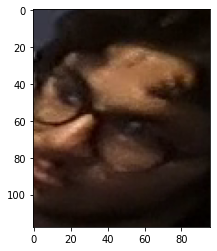

This is Fahad with probability 0.8998


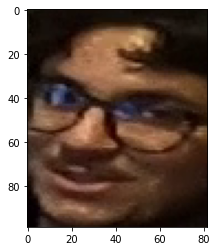

This is Prith with probability 0.9881


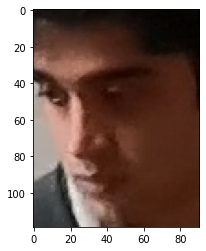

This is Aman with probability 0.9996


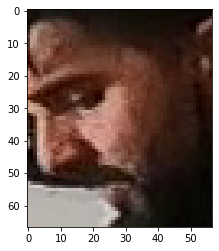

This is Fahad with probability 0.9631


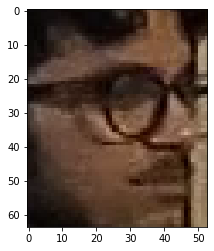

This is Aman with probability 0.2899


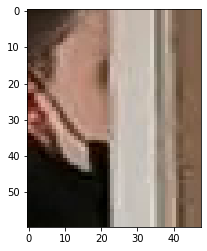

This is Aman with probability 0.954


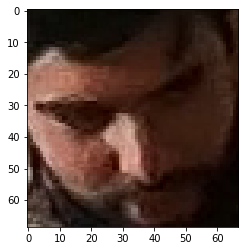

This is Prith with probability 0.9928


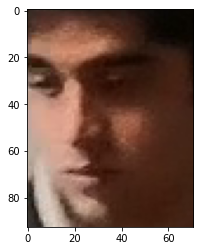

This is Chris with probability 0.9992


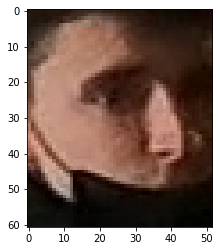

This is Aman with probability 0.9969


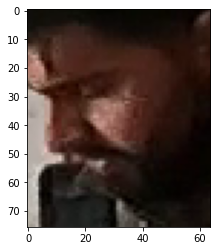

This is Chris with probability 0.9991


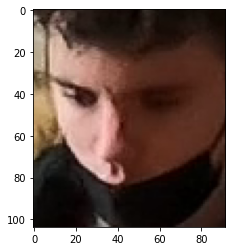

This is Fahad with probability 0.9936


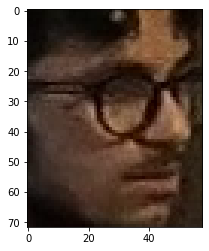

This is Fahad with probability 0.9967


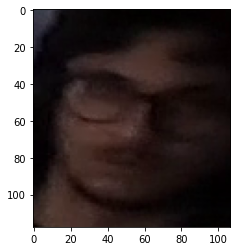

This is Fahad with probability 0.3483


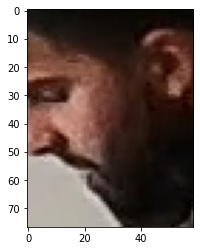

This is Prith with probability 0.9984


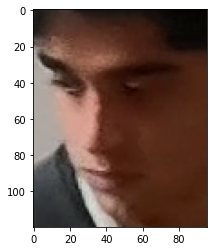

This is Aman with probability 0.983


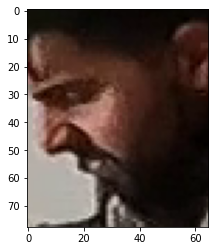

This is Fahad with probability 0.9986


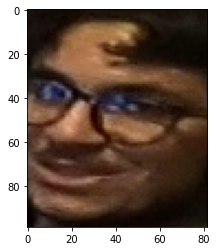

This is Prith with probability 0.9979


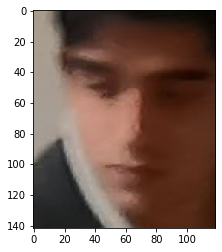

This is Prith with probability 0.9937


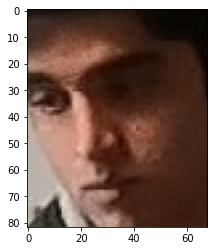

This is Chris with probability 0.9985


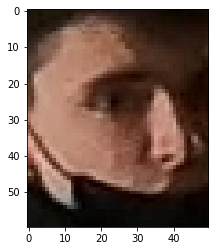

This is Fahad with probability 0.9946


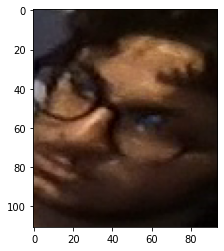

This is Prith with probability 1.0


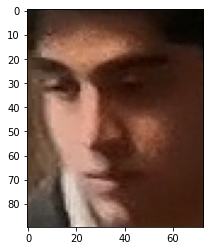

This is Chris with probability 0.9881


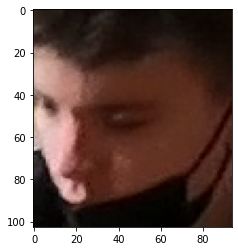

This is Prith with probability 0.9958


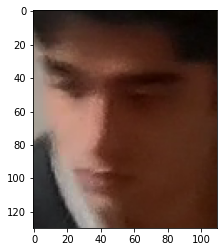

This is Aman with probability 0.7395


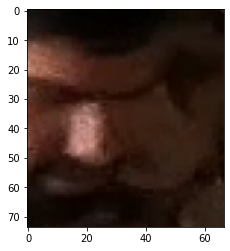

This is Prith with probability 1.0


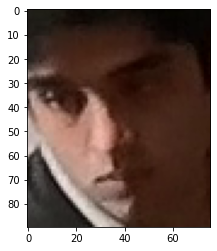

This is Aman with probability 0.9985


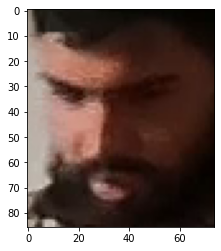

This is Aman with probability 0.9968


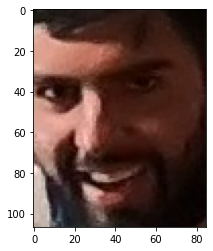

This is Aman with probability 0.999


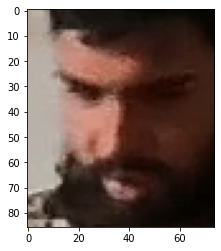

This is Prith with probability 1.0


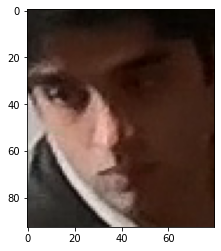

This is Chris with probability 0.9977


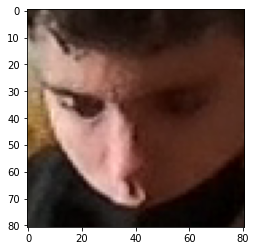

This is Fahad with probability 0.9489


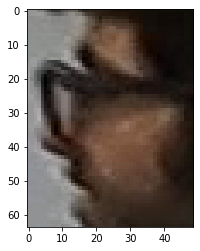

This is Fahad with probability 0.9813


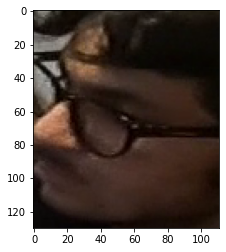

This is Aman with probability 0.9975


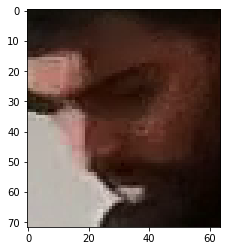

This is Chris with probability 0.866


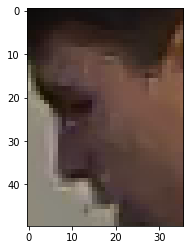

This is Fahad with probability 0.9964


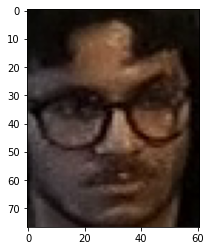

This is Prith with probability 1.0


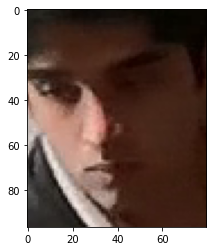

This is Fahad with probability 0.6975


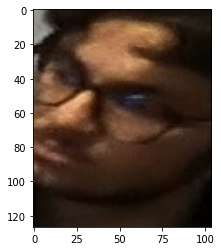

This is Aman with probability 0.9872


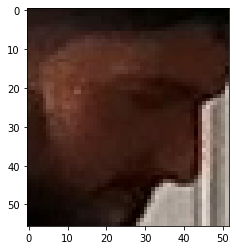

This is Fahad with probability 0.9794


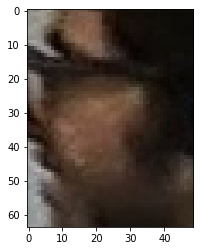

This is Prith with probability 0.9408


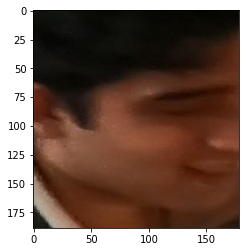

This is Chris with probability 0.9942


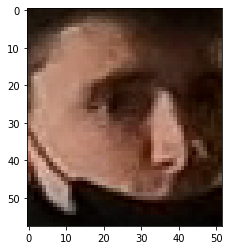

This is Prith with probability 1.0


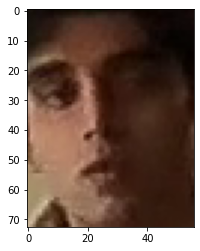

This is Chris with probability 0.9997


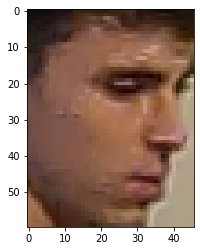

This is Aman with probability 0.8024


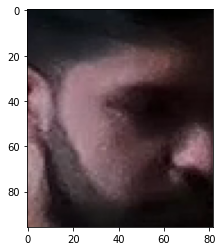

This is Aman with probability 0.9989


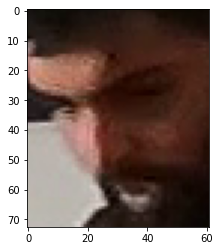

This is Fahad with probability 0.999


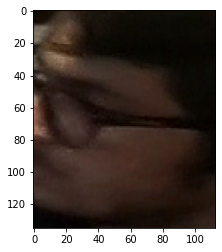

This is Prith with probability 1.0


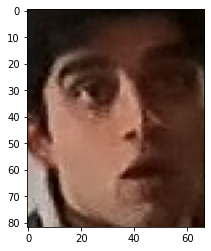

This is Chris with probability 0.5781


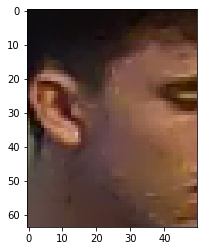

This is Aman with probability 0.9869


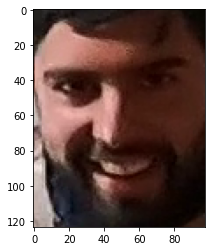

This is Fahad with probability 0.9969


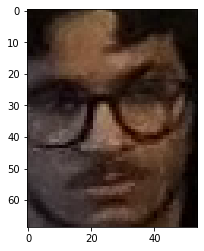

This is Prith with probability 1.0


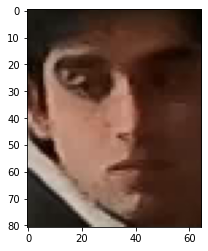

This is Fahad with probability 0.9792


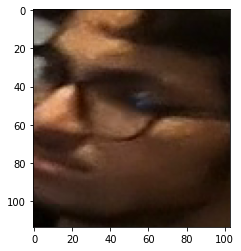

This is Aman with probability 0.9984


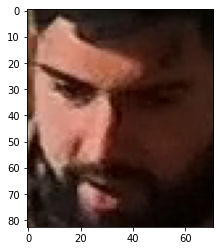

This is Prith with probability 1.0


KeyboardInterrupt: 

In [96]:
for i in range(len(X_test)):
    fig, ax = plt.subplots()
    plt.imshow(cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB))
    pred = model.predict([X_test_norm[i]])
    probs = model.predict_proba([X_test_norm[i]])
    name = out_encoder.classes_[pred][0]
    prob = probs[0][pred][0]
    print(f'This is {name} with probability {prob.round(4)}')
    plt.show()

**Test on Unknown Img**

In [116]:
model.predict_proba(in_encoder.transform([get_embedding(cv2.imread(glob('./Data/Faces/Unknown*')[0]), embedder)]))[0]


array([0.00288896, 0.21172276, 0.03044111, 0.75494717])

**Test on Screenshotted Images**

In [15]:
aman = cv2.imread(f'./Data/Faces/aman_11111.png')
prith = cv2.imread(f'./Data/Faces/prith_11111.png')
chris = cv2.imread(f'./Data/Faces/chris_11111.png')
fahad = cv2.imread(f'./Data/Faces/fahad_11111.png')

In [34]:
out_encoder.classes_

array(['Aman', 'Chris', 'Fahad', 'Prith'], dtype='<U5')

Aman
[[0.91061724 0.01902431 0.00921676 0.06114169]]


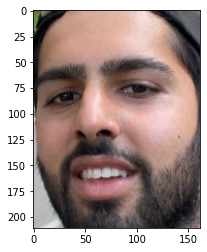

Prith
[[1.18558566e-07 1.89787412e-07 9.97408904e-08 9.99999592e-01]]


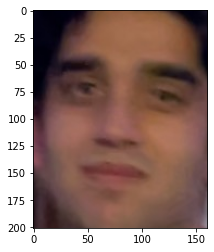

Chris
[[6.95470896e-05 9.87632067e-01 3.40181128e-03 8.89657511e-03]]


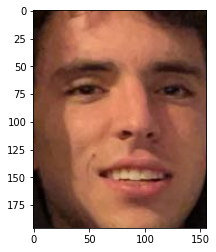

Fahad
[[0.00139597 0.06775285 0.92641609 0.00443509]]


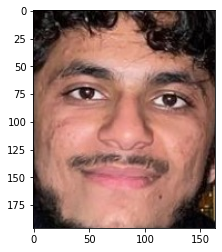

In [33]:
aman_pred = model.predict(in_encoder.transform([get_embedding(aman, embedder)]))[0]
print(out_encoder.classes_[aman_pred])
print(model.predict_proba(in_encoder.transform([get_embedding(aman, embedder)])))
plt.imshow(cv2.cvtColor(aman, cv2.COLOR_RGB2BGR))
plt.show()

prith_pred = model.predict(in_encoder.transform([get_embedding(prith, embedder)]))[0]
print(out_encoder.classes_[prith_pred])
print(model.predict_proba(in_encoder.transform([get_embedding(prith, embedder)])))
plt.imshow(cv2.cvtColor(prith, cv2.COLOR_RGB2BGR))
plt.show()

chris_pred = model.predict(in_encoder.transform([get_embedding(chris, embedder)]))[0]
print(out_encoder.classes_[chris_pred])
print(model.predict_proba(in_encoder.transform([get_embedding(chris, embedder)])))
plt.imshow(cv2.cvtColor(chris, cv2.COLOR_RGB2BGR))
plt.show()

fahad_pred = model.predict(in_encoder.transform([get_embedding(fahad, embedder)]))[0]
print(out_encoder.classes_[fahad_pred])
print(model.predict_proba(in_encoder.transform([get_embedding(fahad, embedder)])))
plt.imshow(cv2.cvtColor(fahad, cv2.COLOR_RGB2BGR))
plt.show()

**PCA on Training Images**

In [117]:
from sklearn.decomposition import PCA

In [174]:
dim_reducer = PCA(2)
X_train_emb_red = dim_reducer.fit_transform(X_train_emb)

In [137]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go

In [182]:
fig = px.scatter(x=X_train_emb_red[:, 0], y=X_train_emb_red[:, 1], color=[out_encoder.classes_[lab] for lab in y_train_enc])
unknown_point = dim_reducer.transform([in_encoder.transform([get_embedding(cv2.imread(glob('./Data/Faces/Unknown*')[0]), embedder)])[0]])
fig.add_trace(go.Scatter(x=unknown_point[:,0], y=unknown_point[:, 1], name='Unknown', mode='markers', marker=dict(symbol='cross', size=15)))
